<a href="https://colab.research.google.com/github/RokelisK123/gilusis/blob/main/RL_2_gym_box2d.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[Gymnasium Box2D](https://gymnasium.farama.org/environments/box2d/)

In [1]:
%%capture
!pip install swig
!pip install gymnasium[box2d]

# LunarLander-v2

In [2]:
import gymnasium as gym
#env = gym.make('LunarLander-v2', render_mode="rgb_array")
env = gym.make('LunarLander-v3', render_mode="rgb_array")


In [3]:
from PIL import Image, ImageDraw, ImageColor, ImageFont
import time

observation, info = env.reset()
images = [Image.fromarray(env.render())]

reset_nr = 0

def render_image(step_i, reset_nr, action, observation):
    image = Image.fromarray(env.render())
    draw = ImageDraw.Draw(image)
    draw.text((0, 0), f"step_i: {step_i}    reset_nr: {reset_nr} \n\n Lander x: {observation[0]:>12.2f} y: {observation[1]:>.2f} \n Lander velocity x: {observation[2]:>10.2f} y:{observation[3]:.2f} \n Lander angle: {observation[4]:>10.2f} angular velocity:{observation[5]:.2f} \n Leg 1 is in contact: {observation[6]} Leg 2 is in contact: {observation[7]}  \n\n Action: {action:>19}", ImageColor.getrgb('green'),font=ImageFont.truetype("LiberationMono-Italic.ttf", 12))
    return image

def get_action(observation):
    x, y, x_vel, y_vel, angle, angular_vel, left_contact, right_contact = observation

    # jei krenta per greitai, naudoja pagrindinį variklį
    if y_vel < -0.5:
        return 2  #pagrindinio variklios ijungimas

    # jei per daug pakreiptas, pataisykite
    if angle < -0.2:
        return 3  # desinio variklio ijungimas
    elif angle > 0.2:
        return 1  # kairio variklio ijungimas

    # jei juda per greitai horizontaliai, pataisome
    if x_vel < -0.5:
        return 3  # desinio variklio ijungimas
    elif x_vel > 0.5:
        return 1  # kairio variklio ijungimas

    # jeigu viskas pagal tvarką, nekeisti nieko
    return 0

for step_i in range(400):
    action = get_action(observation)  # Use our control function instead of random
    observation, reward, terminated, truncated, info = env.step(action)
    image = render_image(step_i, reset_nr, action, observation)
    images.append(image)

    if terminated or truncated:
        for i in range(1, 20):
            images.append(image)
        observation, info = env.reset()
        image = Image.fromarray(env.render())
        draw = ImageDraw.Draw(image)
        images.append(image)
        reset_nr = reset_nr + 1



for step_i in range(400):
    action = env.action_space.sample()  # this is where you would insert your policy
    if action not in [2]:
        action = env.action_space.sample()
        observation, reward, terminated, truncated, info = env.step(action)
    else:
        observation, reward, terminated, truncated, info = env.step(2)

    image = render_image(step_i, reset_nr, action, observation)
    images.append(image)


    if terminated or truncated:
        for i in range(1, 20):
            images.append(image)
        observation, info = env.reset()
        image = Image.fromarray(env.render())
        draw = ImageDraw.Draw(image)
        #draw.text((300, 0), f"Terminated", ImageColor.getrgb('red'),font=ImageFont.truetype("Humor-Sans.ttf", 36))
        images.append(image)
        reset_nr = reset_nr + 1

env.close()

Action Space: Discrete(4)
Observation Space: Box([ -2.5        -2.5       -10.        -10.         -6.2831855 -10.
  -0.         -0.       ], [ 2.5        2.5       10.        10.         6.2831855 10.
  1.         1.       ], (8,), float32)
Max Episode Steps: 1000
Nondeterministic: False
Reward Threshold: 200


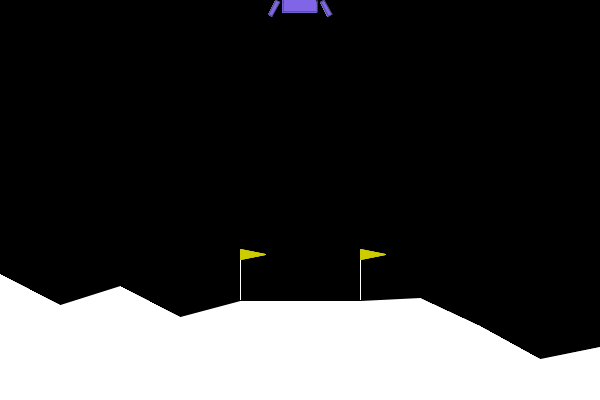

In [4]:
import IPython.display  as IPdis

images[0].save( 'LunarLander-v2.gif', save_all=True, append_images=images[1:], loop=0, duration=200)  # loop=0: loop forever, duration=1: play each frame for 1000ms

print(f"Action Space: {env.action_space}")
print(f"Observation Space: {env.observation_space}")
print(f"Max Episode Steps: {env.spec.max_episode_steps}")
print(f"Nondeterministic: {env.spec.nondeterministic}")
#print(f"Reward Range: {env.reward_range}")
print(f"Reward Threshold: {env.spec.reward_threshold}")

IPdis.Image(filename='LunarLander-v2.gif')

In [5]:
import ipywidgets as widgets
from IPython.display import display, clear_output

observation, info = env.reset()
#reset_nr = 0
step_i = 0

button_right = widgets.Button(description='👉🏻 Right')
button_left = widgets.Button(description='Left 👈🏻')
button_central = widgets.Button(description='Main 🗜️')
button_reset = widgets.Button(description='↻ Reset ↻')

action_list=['do nothing', 'fire left engine', 'fire main engine', 'fire right engine']
answer_buttons = widgets.ToggleButtons( options=action_list,  description='Action:',value=None)

def on_button_right_clicked(b):
    global step_i
    observation, reward, terminated, truncated, info = env.step(1)
    step_i = step_i + 1
    image = render_image(step_i, 0, 1, observation)
    with out:
        clear_output(wait=True)
        display(image)

def on_button_left_clicked(b):
    global step_i
    observation, reward, terminated, truncated, info = env.step(0)
    step_i = step_i + 1
    image = render_image(step_i, 0, 0, observation)
    with out:
        clear_output(wait=True)
        display(image)

def on_button_reset_clicked(b):
    global step_i
    observation, info = env.reset()
    step_i = 0
    image = render_image(0, 0, 0, observation)
    with out:
        clear_output(wait=True)
        display(image)

def on_click(change):
    global options, step_i, answer_buttons
    if answer_buttons.value == None:
      return

    user_answer = change['new']

    index = action_list.index(user_answer)
    observation, reward, terminated, truncated, info = env.step(index)
    step_i = step_i + 1
    image = render_image(step_i, 0, 0, observation)
    with out:
        clear_output(wait=True)
        display(image)

    answer_buttons.value = None



button_right.on_click(on_button_right_clicked)
button_left.on_click(on_button_left_clicked)
button_reset.on_click(on_button_reset_clicked)

answer_buttons.observe(on_click, 'value')



out = widgets.Output()
image = render_image(0, 0, 0, observation)
with out:
    clear_output(wait=True)
    display(image)

display(widgets.HBox([button_left, button_right,button_reset]))
display(answer_buttons)
display(out)

ToggleButtons(description='Action:', options=('do nothing', 'fire left engine', 'fire main engine', 'fire righ…

Output()

# BipedalWalker-v3

In [6]:
import gymnasium as gym
env = gym.make("BipedalWalker-v3", render_mode="rgb_array", hardcore=False)

In [7]:
def get_action(observation):
    hull_angle = observation[0]
    hull_vel = observation[1]
    hip1_angle = observation[4]
    knee1_angle = observation[6]
    hip2_angle = observation[8]
    knee2_angle = observation[10]

    actions = [0.0, 0.0, 0.0, 0.0]  # [hip1, knee1, hip2, knee2]

    # Išlaikyti korpusą tiesų
    if hull_angle < -0.1:
        actions[0] += 0.1  # Pakelti pirmą koją
        actions[2] -= 0.1  # Nuleisti antrą koją
    elif hull_angle > 0.1:
        actions[0] -= 0.1
        actions[2] += 0.1

    # Kojų judesių koordinavimas
    # Pirma koja
    if hip1_angle < -0.5:
        actions[0] += 0.1  # Kelti
    elif hip1_angle > 0.5:
        actions[0] -= 0.1  # Leisti

    if knee1_angle < 0:
        actions[1] += 0.1  # Tiesti
    else:
        actions[1] -= 0.1  # Lenkti

    # Antra koja (priešinga fazė)
    if hip2_angle < -0.5:
        actions[2] += 0.1
    elif hip2_angle > 0.5:
        actions[2] -= 0.1

    if knee2_angle < 0:
        actions[3] += 0.1
    else:
        actions[3] -= 0.1

    return actions

Action Space: Box(-1.0, 1.0, (4,), float32)
Observation Space: Box([-3.1415927 -5.        -5.        -5.        -3.1415927 -5.
 -3.1415927 -5.        -0.        -3.1415927 -5.        -3.1415927
 -5.        -0.        -1.        -1.        -1.        -1.
 -1.        -1.        -1.        -1.        -1.        -1.       ], [3.1415927 5.        5.        5.        3.1415927 5.        3.1415927
 5.        5.        3.1415927 5.        3.1415927 5.        5.
 1.        1.        1.        1.        1.        1.        1.
 1.        1.        1.       ], (24,), float32)
Max Episode Steps: 1600
Nondeterministic: False
Reward Threshold: 300


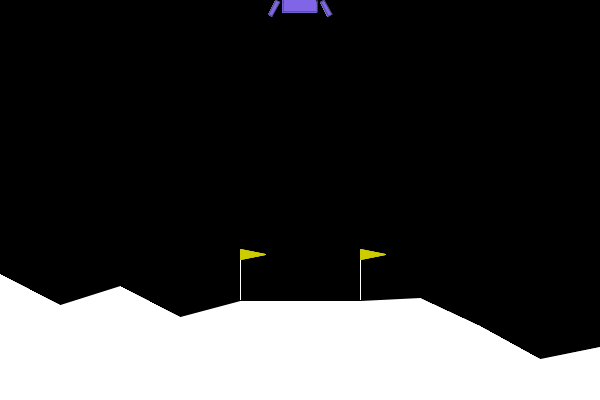

In [8]:
import IPython.display  as IPdis

images[0].save( 'LunarLander-v2.gif', save_all=True, append_images=images[1:], loop=0, duration=200)  # loop=0: loop forever, duration=1: play each frame for 1000ms

print(f"Action Space: {env.action_space}")
print(f"Observation Space: {env.observation_space}")
print(f"Max Episode Steps: {env.spec.max_episode_steps}")
print(f"Nondeterministic: {env.spec.nondeterministic}")
#print(f"Reward Range: {env.reward_range}")
print(f"Reward Threshold: {env.spec.reward_threshold}")

IPdis.Image(filename='LunarLander-v2.gif')

#CarRacing-v1

In [9]:
import gymnasium as gym
#env = gym.make("CarRacing-v2", render_mode="rgb_array", domain_randomize=False )
env = gym.make("CarRacing-v3", render_mode="rgb_array", domain_randomize=False )

In [23]:
import gymnasium as gym
from PIL import Image, ImageDraw, ImageColor, ImageFont
import time
import numpy as np
import cv2

env = gym.make("CarRacing-v3", render_mode="rgb_array", domain_randomize=False)

observation, info = env.reset()
images = [Image.fromarray(env.render())]

reset_nr = 0
integral_error = 0
previous_error = 0

def render_image(step_i, reset_nr, action, observation):
    image = Image.fromarray(env.render())
    draw = ImageDraw.Draw(image)
    return image

def get_action(observation):
    # Look at two regions: near and far for better turn detection
    road_near = observation[65:75, :, 1]  # Near view
    road_far = observation[45:55, :, 1]   # Looking even further ahead for turns

    # Default actions
    steering = 0.0
    gas = 0.3
    brake = 0.0

    # Find road in both views
    road_pixels_near = road_near < 100
    road_pixels_far = road_far < 100

    if np.any(road_pixels_near):
        # Process near view for immediate steering
        near_indices = np.where(road_pixels_near)[1]
        near_left = np.min(near_indices) if len(near_indices) > 0 else 0
        near_right = np.max(near_indices) if len(near_indices) > 0 else observation.shape[1]
        near_center = (near_left + near_right) // 2

        # Calculate basic steering
        image_center = observation.shape[1] // 2
        steering = (near_center - image_center) / (image_center)

        # Process far view for turn prediction
        if np.any(road_pixels_far):
            far_indices = np.where(road_pixels_far)[1]
            far_left = np.min(far_indices) if len(far_indices) > 0 else 0
            far_right = np.max(far_indices) if len(far_indices) > 0 else observation.shape[1]
            far_center = (far_left + far_right) // 2

            # Calculate turn severity
            turn_difference = far_center - near_center

            # More aggressive steering in turns
            if abs(turn_difference) > 10:  # Lowered threshold to detect turns earlier
                # Increase steering based on turn severity
                steering_multiplier = 1.5 + (abs(turn_difference) / 50)  # More aggressive in sharper turns
                steering *= steering_multiplier
                gas = 0.25     # Moderate speed in turns

                # Add extra steering in the direction of the turn
                if turn_difference > 0:  # Right turn
                    steering += 0.45
                else:  # Left turn
                    steering -= 0.20

                if abs(turn_difference) > 35:  # Very sharp turn
                    gas = 0.2
                    brake = 0.1
            else:
                steering = np.clip(steering * 0.6, -1, 1)
                gas = 0.4  # Good speed on straights

            # Maintain turn until properly aligned
            if abs(steering) > 0.6:  # If we're in a significant turn
                gas = 0.1  # Keep speed moderate until turn is complete
        else:
            # If can't see far road, be more cautious but maintain steering
            steering = np.clip(steering * 0.8, -1, 1)
            gas = 0.25
    else:
        # Emergency handling when no road is visible
        brake = 0.3
        gas = 0.0
        steering = 0.0

    # Final safety clipping
    steering = np.clip(steering, -1, 1)
    gas = np.clip(gas, 0, 1)
    brake = np.clip(brake, 0, 1)

    return np.array([steering, gas, brake])

# Rest of your code remains the same

for step_i in range(400):
    action = get_action(observation)
    observation, reward, terminated, truncated, info = env.step(action)

    image = render_image(step_i, reset_nr, action, observation)
    images.append(image)

    if terminated or truncated:
        for i in range(1, 20):
            images.append(image)
        observation, info = env.reset()
        image = Image.fromarray(env.render())
        draw = ImageDraw.Draw(image)
        images.append(image)
        reset_nr = reset_nr + 1

env.close()

Action Space: Box([-1.  0.  0.], 1.0, (3,), float32)
Observation Space: Box(0, 255, (96, 96, 3), uint8)
Max Episode Steps: 1000
Nondeterministic: False
Reward Threshold: 900


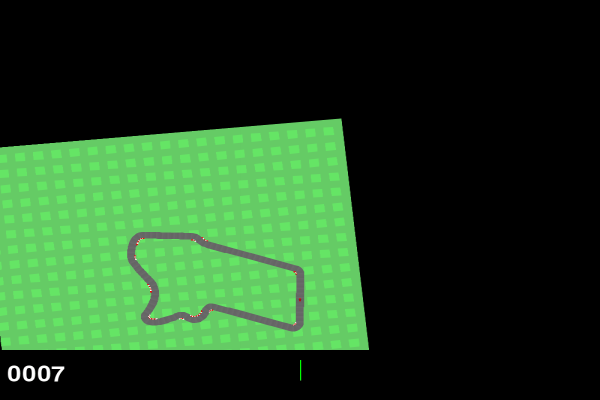

In [24]:
# Save and display the animation
images[0].save('CarRacing.gif', save_all=True, append_images=images[1:], loop=0, duration=200)

print(f"Action Space: {env.action_space}")
print(f"Observation Space: {env.observation_space}")
print(f"Max Episode Steps: {env.spec.max_episode_steps}")
print(f"Nondeterministic: {env.spec.nondeterministic}")
print(f"Reward Threshold: {env.spec.reward_threshold}")

IPdis.Image(filename='CarRacing.gif')